Select two images of different dates that depict the same region.

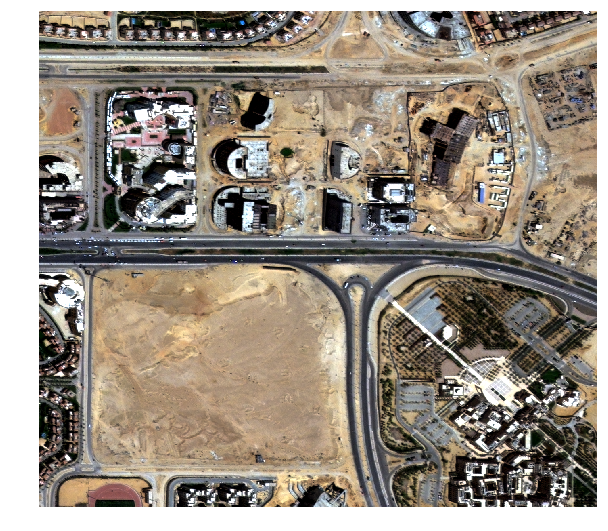

In [2]:
#1st date of selected region
from gbdxtools.task import env
from gbdxtools import CatalogImage
%matplotlib inline
catalog_id1 = env.inputs.get('catalog_id', '1030010030AECE00')
bbox = env.inputs.get('bbox', '31.48962736129761, 30.0206702997688, 31.499991416931156, 30.02988506414524')
image1 = CatalogImage(catalog_id1 ,band_type='MS',pansharpen=True, acomp=True, bbox=map(float, bbox.split(",")))
image1.plot(w=10, h=10)

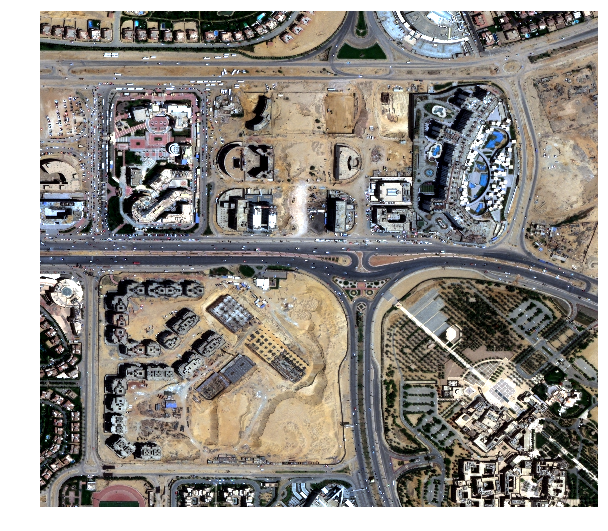

In [3]:
#second date of selected region
from gbdxtools.task import env
from gbdxtools import CatalogImage
catalog_id2 = env.inputs.get('catalog_id', '103001007D9BB000')
bbox = env.inputs.get('bbox', '31.48962736129761, 30.0206702997688, 31.499991416931156, 30.02988506414524')
image2 = CatalogImage(catalog_id2, band_type='MS',pansharpen=True, acomp=True, bbox=map(float, bbox.split(",")))
image2.plot(w=10,h=10)

In [4]:
bbox1=bbox.split(',')
bbox=[]
for i in bbox1:
    bbox.append(float(i))

from shapely.geometry import box, shape
bounds=box(bbox[0], bbox[1], bbox[2], bbox[3])

In [5]:
images=[]
images.append(image1)
images.append(image2)

In [6]:
from functools import partial
import os

from shapely import ops
import pyproj
import numpy as np
from rio_hist.match import histogram_match
import matplotlib.pyplot as plt

import warnings
%matplotlib inline

from gbdxtools import CatalogImage, TmsImage

MAPBOX_API_KEY = os.environ.get("MAPBOX_API_KEY")
if not MAPBOX_API_KEY:
    print("Env var MAPBOX_API_KEY not found, please uncomment and define variable MAPBOX_API_KEY below")
    #warnings.warn(msg, TokenWarning)
    
#MAPS_API_KEY = "INSERT MAPS API TOKEN"

tms = TmsImage(access_token=MAPBOX_API_KEY, zoom=18)

def match_colors_to_ref(region):
    tfm = partial(pyproj.transform, 
              pyproj.Proj(init=region.__geo_transform__.proj), 
              pyproj.Proj(init="epsg:3857"))
    boundary = ops.transform(tfm, shape(region))
    tms_region = tms[boundary]
    data = region[[4,2,1],...].read()
    ref = tms_region.read()
    out = np.dstack([histogram_match(data[idx,:,:], ref[idx,:,:].astype(np.double)/255.0) 
                     for idx in range(data.shape[0])])
    return out

In [7]:
#atmospheric correction
atm_images=[]
for region in images:
    atm_images.append(match_colors_to_ref(region))

In [8]:
#convert images to the same resolution
!pip install opencv-python
import cv2
ymin=min(image1.shape[1], image2.shape[1])
xmin=min(image1.shape[2], image2.shape[2])

atm_images[0]=cv2.resize(atm_images[0], (xmin,ymin), interpolation = cv2.INTER_AREA)
atm_images[1]=cv2.resize(atm_images[1], (xmin,ymin), interpolation = cv2.INTER_AREA)

  Cache entry deserialization failed, entry ignored
  Using cached https://files.pythonhosted.org/packages/7c/78/bc95e29057e80d1da71912426113e85f20752b1031193f51750322354937/opencv_python-3.4.1.15-cp36-cp36m-manylinux1_x86_64.whl
gbdxtools 0.15.6 requires bumpversion, which is not installed.
gbdxtools 0.15.6 requires mock, which is not installed.
gbdxtools 0.15.6 requires pytest, which is not installed.
gbdxtools 0.15.6 requires pytest-runner, which is not installed.
gbdxtools 0.15.6 requires vcrpy, which is not installed.


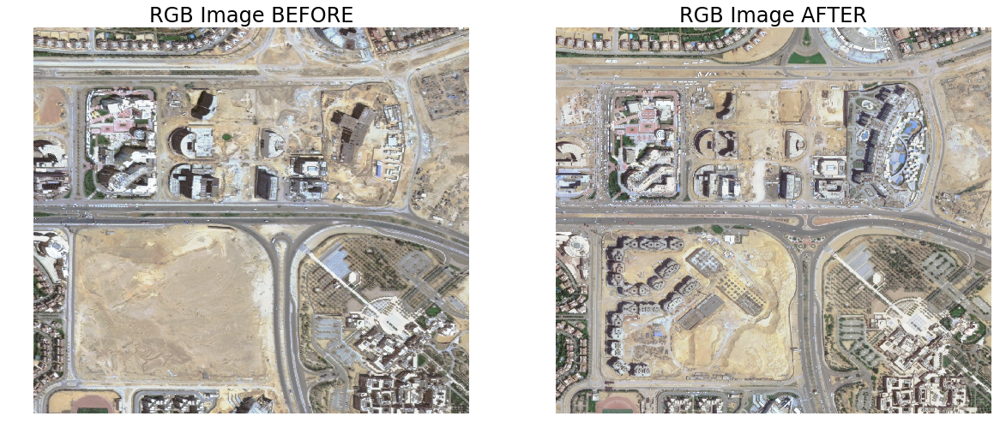

In [11]:
#plot the 'before and after' of rgb images
plt.figure(figsize=(20,20))

# plot the RGB image
sp = plt.subplot(1,2,1)
plt.axis('off')
sp.set_title("RGB Image BEFORE", fontsize=24)
plt.imshow(atm_images[0])

# plot the RGB image
sp = plt.subplot(1,2,2)
plt.axis('off')
sp.set_title("RGB Image AFTER", fontsize=24)
plt.imshow(atm_images[1])

In [12]:
#save rgb images
cnt=1
for atm in atm_images:
    np.save('RGBImage_{}.npy'.format(cnt), atm)##edw swzetai i diorthwmeni eikona se rgb format
    cnt=cnt+1

Load trained weights to produce predictions for the two images and find changes

In [13]:
!pip install torch
!pip install tqdm

import sys
from skimage import img_as_float, io
import itertools
from tqdm import tqdm_notebook
import torch
from torch.autograd import Variable
import segnet_model

model=segnet_model.SegNet()
model.load_state_dict(torch.load('model11.pth',map_location=lambda storage, loc: storage))
model.eval()
mean=np.load('mean.npy')
stdv=np.load('stdv.npy')
BATCH_SIZE=1
test_patch=128
stride=64
window_size=128
import segnet_model

  Cache entry deserialization failed, entry ignored
  Using cached https://files.pythonhosted.org/packages/69/43/380514bd9663f1bf708abeb359b8b48d3fabb1c8e95bb3427a980a064c57/torch-0.4.0-cp36-cp36m-manylinux1_x86_64.whl
gbdxtools 0.15.6 requires bumpversion, which is not installed.
gbdxtools 0.15.6 requires mock, which is not installed.
gbdxtools 0.15.6 requires pytest, which is not installed.
gbdxtools 0.15.6 requires pytest-runner, which is not installed.
gbdxtools 0.15.6 requires vcrpy, which is not installed.
  Cache entry deserialization failed, entry ignored
  Using cached https://files.pythonhosted.org/packages/93/24/6ab1df969db228aed36a648a8959d1027099ce45fad67532b9673d533318/tqdm-4.23.4-py2.py3-none-any.whl
gbdxtools 0.15.6 requires bumpversion, which is not installed.
gbdxtools 0.15.6 requires mock, which is not installed.
gbdxtools 0.15.6 requires pytest, which is not installed.
gbdxtools 0.15.6 requires pytest-runner, which is not installed.
gbdxtools 0.15.6 requires vcrpy, 

In [14]:
def sliding_window(top, step=10, window_size=(20,20)):
    for x in range(0, top.shape[0], step):
        if x + window_size > top.shape[0]:
            x = top.shape[0] - window_size
        for y in range(0, top.shape[1], step):
            if y + window_size > top.shape[1]:
                y = top.shape[1] - window_size
            yield x, y, window_size, window_size
 
def count_sliding_window(top, step=10, window_size=(20,20)):
    c = 0
    for x in range(0, top.shape[0], step):
        if x + window_size > top.shape[0]:
            x = top.shape[0] - window_size
        for y in range(0, top.shape[1], step):
            if y + window_size > top.shape[1]:
                y = top.shape[1] - window_size
            c += 1
    return c

def process_patches(images, net, mean, stdv):
    images=np.asarray(images)
    images=np.transpose(images, (0,3,1,2))
    images=images/1.
    for ch in range(0,3):
        images[:,ch,:,:]=(images[:,ch,:,:]-mean[ch])/float(stdv[ch])

    images_v=Variable(torch.from_numpy(images).float())
    images_v=images_v #.cuda()
    output=model(images_v.float())
    output=output.cpu().data.numpy()
    output=np.transpose(output, (0,2,3,1))
    return output

def grouper(n, iterable):
    it = iter(iterable)
    while True:
        chunk = tuple(itertools.islice(it, n))
        if not chunk:
            return
        yield chunk


def predict(image, net, mean, stdv, step=64, patch_size=(256,256)):
    votes = np.zeros(image.shape[:2] + (2,))
    signal = np.zeros(image.shape[:2])
    for coords in tqdm_notebook(grouper(BATCH_SIZE, sliding_window(image, step, patch_size)), total=count_sliding_window(image, step, patch_size)/BATCH_SIZE + 1):
        image_patches = []
        for x,y,w,h in coords:
            image_patches.append(image[x:x+w, y:y+h])

        predictions = process_patches(image_patches, net, mean, stdv)
        for (x,y,w,h), prediction in zip(coords, predictions):
            for i in range(x, x+w):
                for j in range(y, y+h):
                    signal[i,j] +=1
                    votes[i,j] += prediction[i-x, j-y]

    return votes, signal

In [16]:
#testing..
pred=[]
sign=[]
cnt=1
for atm in atm_images:
    print('Producing predictions for Image {}'.format(cnt))
    pr, sig =(predict(atm, model, mean, stdv, step=stride, patch_size=test_patch))
    pred.append(pr)
    sign.append(sig)
    cnt=cnt+1

Producing predictions for Image 1



Producing predictions for Image 2


In [32]:
#convert prediction probabilities to 0-1 range 
buildings=[]
for dp in range(0,2):
    build=pred[dp][:,:,0]
    build=build/sign[dp].astype(float)
    buildings.append(build)
    
b_print=[]
for dp in range(0,2):
    min_b = buildings[dp].min()
    max_b = buildings[dp].max()
    normalised = np.zeros((buildings[dp].shape[0],buildings[dp].shape[1]))
    normalised = (buildings[dp] - min_b)/ float(max_b-min_b)
    b_print.append(normalised)

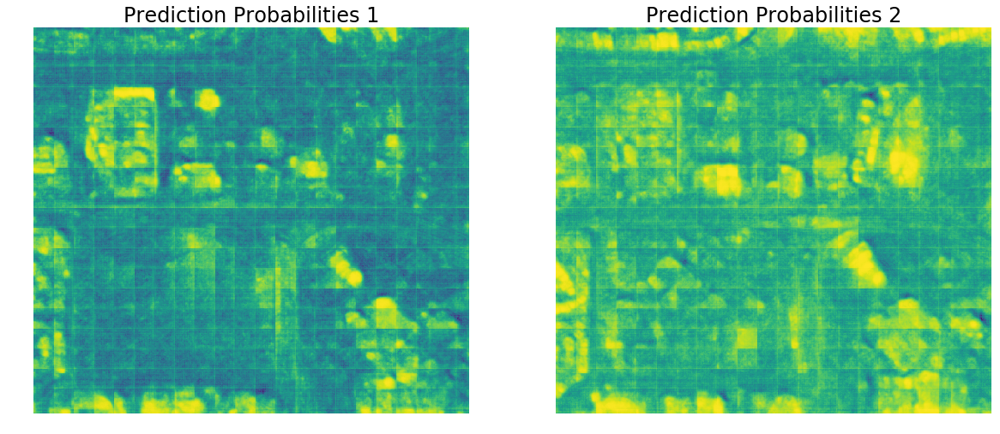

In [33]:
#print probabilities
plt.figure(figsize=(20,20))

sp = plt.subplot(1,2,1)
plt.axis('off')
sp.set_title("Prediction Probabilities 1", fontsize=24)
plt.imshow(b_print[0])

sp = plt.subplot(1,2,2)
plt.axis('off')
sp.set_title("Prediction Probabilities 2", fontsize=24)
plt.imshow(b_print[1])

In [34]:
#save probabilities
for dp in range(1,3):
    np.save('PROBS_{}.npy'.format(dp), b_print[dp-1])

Overlay roads to the probability vectors. Roads belong to the non-buildings category so we want to exclude these pixels to make the predictions a little more accurate.


In [35]:
# import modules
from gbdxtools import Interface
from gbdxtools import CatalogImage
from gbdxtools.task import env
from shapely import geometry
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import rasterio
from shapely.geometry import box, shape
import rasterio
import rasterio.features
from shapely.ops import cascaded_union
from functools import partial
import pyproj
from shapely.ops import transform

# connect to gbdx
gbdx = Interface()

In [36]:
# convert the bounding box into a well-known text format
bbox_wkt = box(*bbox).wkt

# (results come back formatted as geojson)
roads_geojson = gbdx.vectors.query(bbox_wkt, query="ingest_source:OSM AND item_type:Road", index="vector-osm-*")

# how many are there?
print('Number of road features:', len(roads_geojson))

Number of road features: 51


In [37]:
# convert each road geojson into a Shapely geometry object
geom_list = []
for geojson in roads_geojson:
    geom = shape(geojson['geometry'])
    geom_list.append(geom)

# union (i.e., merge) the results into a single geometry
roads = cascaded_union(geom_list)

In [38]:
# convert roads from lines to polygons to capture the road width
# (assume roads are 7 m wide)

# create a function for coordinate system transformations
def project(src_epsg, dest_epsg, geom):
    
    project = partial(pyproj.transform,
                      pyproj.Proj(init='epsg:{}'.format(src_epsg)), # source coordinate system
                      pyproj.Proj(init='epsg:{}'.format(dest_epsg))) # destination coordinate system


    geom_projected = transform(project, geom)
    
    return geom_projected

# project roads from WGS84 (geographic coordinates) to UTM Zone 32615 (meters)
roads_utm = project(4326, 32615, roads)
# buffer the roads by 3.5 m on each side (7 m total)
roads_utm_buffered = roads_utm.buffer(3.5)
# project back to WGS84 (geographic coordinates) 
roads_buffered = project(32615, 4326, roads_utm_buffered)

# how do the results look?
gbdx.vectors.map([{'geometry': roads_buffered.__geo_interface__}], zoom=13)

<IPython.core.display.Javascript object>

In [39]:
# convert roads from polygon to a raster (i.e., array)
# values: 1 = road, 0 = not road

# get the number of rows and columns in the source image
nrows = image1.shape[1]
ncols = image1.shape[2]

# run the rasterize command to convert the buffered road features into a raster mask
# of the same size and shape as the source image
road_array = rasterio.features.rasterize(
    [(roads_buffered, 1)],
    out_shape=(nrows, ncols),
    transform=image1.affine,
    fill=0,
    all_touched=True,
    dtype=np.uint8)

In [40]:
#save roads_array
np.save('ROADS.npy', road_array)

In [41]:
#find road pixels in roads_array
xy_roads=np.where(road_array==1)

In [50]:
#overlay roads on predictions
b_print[0][xy_roads]=0
b_print[1][xy_roads]=0

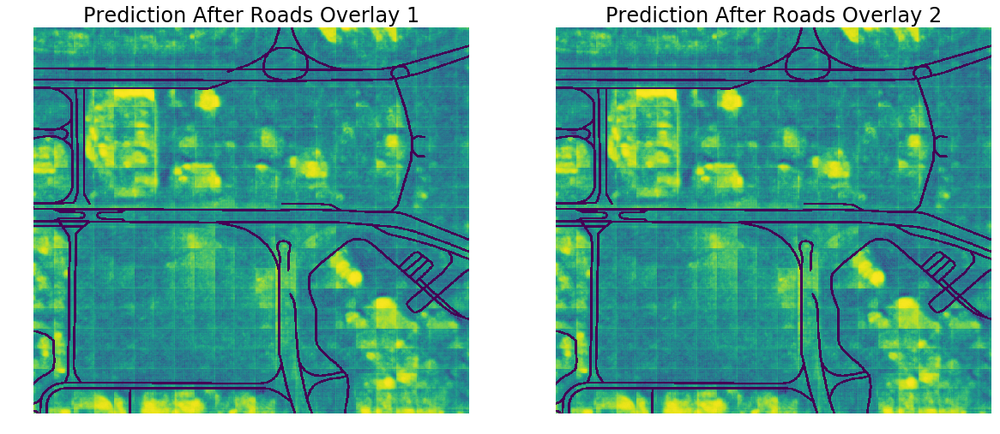

In [51]:
#print probabilities with overlaid roads
plt.figure(figsize=(20,20))

sp = plt.subplot(1,2,1)
plt.axis('off')
sp.set_title("Prediction After Roads Overlay 1", fontsize=24)
plt.imshow(b_print[0])

sp = plt.subplot(1,2,2)
plt.axis('off')
sp.set_title("Prediction After Roads Overlay 2", fontsize=24)
plt.imshow(b_print[0])

Calculate the absolute difference between probabilities to highlight the changes.

In [44]:
#take the absolute difference od the probability vectors to find the change
diff=abs(b_print[0]-b_print[1])

In [45]:
#save difference
np.save('DIFF.npy', diff)

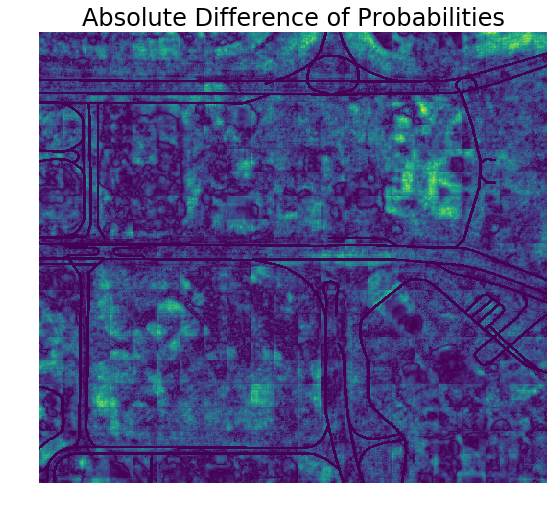

In [46]:
#print absolute difference of probabilities to detect changes
plt.figure(figsize=(20,20))

sp = plt.subplot(1,2,1)
plt.axis('off')
sp.set_title("Absolute Difference of Probabilities", fontsize=24)
plt.imshow(diff)

In [52]:
import imageio
from IPython.display import Image
images=[]
images.append(atm_images[1])
images.append(diff)
imageio.mimsave('generate_animation.gif', images, fps=1)

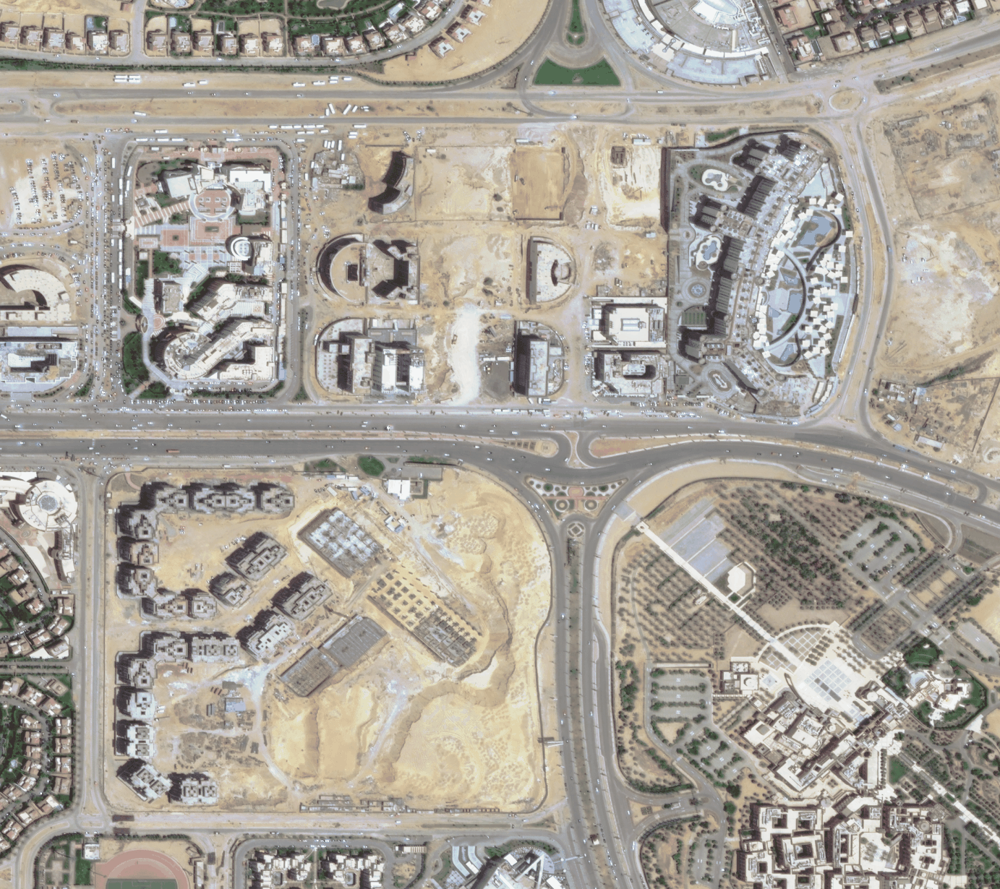

In [53]:
from IPython.display import Image
Image(filename="generate_animation.gif")